Sizlere bir ağ trafiği verisi sunuyoruz. Bu veride hem meşru trafik hem de saldırı trafiği bulunmaktadır. Göreviniz, bu veriyi analiz etmek ve genel trafiği görselleştirmek için uygun yöntemleri kullanmaktır. Örnek olarak, içten içe ve içten dışa trafiğin yoğunluğunu belirlemek, en çok trafik yapan ve en çok veri indiren adresleri tespit etmek gibi durumları göz önünde bulundurabilirsiniz. Ayrıca, bu trafik verisi üzerinden bazı yaygın siber saldırıları tespit etmek de beklenmektedir.

 

İşte görevinizde yardımcı olabilecek bazı adımlar:

 

Veri Keşfi ve Temizleme: İlk adım olarak, veri setini inceleyiniz ve gerekiyorsa temizleyiniz. Anlamlı verileri ayıklamak ve anormallikleri tespit etmek için görselleştirmeler yapılmalıdır.

Trafik Analizi: Veri setini ayrıntılı olarak analiz edin. İçten içe ve içten dışa trafiği belirleyin, en yoğun zaman dilimlerini ve trafik kaynaklarını belirleyin.

Görselleştirme: Analiz sonuçlarını görselleştirerek sunum yapınız. Grafikler, tablolar gibi görsel araçları kullanarak trafiği anlamak ve sunmak daha etkili olabilir.

Siber Saldırı Tespiti: Port taraması, Bruteforce saldırıları ve ARP Scan, Exfiltration, Execution gibi siber saldırıları belirlemek için veriyi inceleyiniz. Bu saldırıları gerçekleştiren IP adreslerini ve hedef IP adreslerini tespit ediniz. Ayrıca, saldırıların zamanını da analiz ediniz.

Raporlama: Analiz sonuçlarını içeren kapsamlı bir rapor hazırlayınız. Raporunuzda, kullanılan metodolojiyi, bulguları ve tavsiyelerinizi açıkça belirtmeniz istenmektedir.

 

Bu case ile ilgili çalışırken Python kullanmayı ve kaynak kodlarınızı da paylaşmayı unutmayınız. Bu case için geri dönüş süresi 1 haftadır. Tüm adımların tamamlanması şart değildir.  

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
pd.set_option('display.max_columns',None)

In [3]:
df = pd.read_csv(r'C:\Users\Admin\OneDrive\Desktop\NextRay\ds_mulakat.csv')

C:\Users\Admin\AppData\Local\Temp\ipykernel_1596\926143714.py:1: DtypeWarning: Columns (102,116) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(r'C:\Users\Admin\OneDrive\Desktop\NextRay\ds_mulakat.csv')


In [4]:
df1 = df.copy()

In [5]:
df.head()

,sync_name,source_address,destination_address,source_port,destination_port,protocol,app_protocol,application_name,application_category_name,master_application_name,tunnel_source_address,tunnel_destination_address,source_mac,destination_mac,tunnel_value,package_count,login_fail_count,login_success,expiration_id,drop_eligible,priority,vlan_identifier,event_time,bidirectional_first_seen_ms,bidirectional_last_seen_ms,bidirectional_duration_ms,bidirectional_bytes,bidirectional_max_piat_ms,bidirectional_max_ps,bidirectional_mean_piat_ms,bidirectional_mean_ps,bidirectional_min_piat_ms,bidirectional_min_ps,bidirectional_packets,bidirectional_stddev_piat_ms,bidirectional_stddev_ps,bidirectional_syn_packets,bidirectional_cwr_packets,bidirectional_ece_packets,bidirectional_urg_packets,bidirectional_ack_packets,bidirectional_psh_packets,bidirectional_rst_packets,bidirectional_fin_packets,src2dst_first_seen_ms,src2dst_last_seen_ms,src2dst_duration_ms,src2dst_packets,src2dst_bytes,src2dst_max_piat_ms,src2dst_max_ps,src2dst_mean_piat_ms,src2dst_mean_ps,src2dst_min_piat_ms,src2dst_min_ps,src2dst_stddev_piat_ms,src2dst_stddev_ps,src2dst_syn_packets,src2dst_cwr_packets,src2dst_ece_packets,src2dst_urg_packets,src2dst_ack_packets,src2dst_psh_packets,src2dst_rst_packets,src2dst_fin_packets,dst2src_first_seen_ms,dst2src_last_seen_ms,dst2src_duration_ms,dst2src_packets,dst2src_bytes,dst2src_max_piat_ms,dst2src_max_ps,dst2src_mean_piat_ms,dst2src_mean_ps,dst2src_min_piat_ms,dst2src_min_ps,dst2src_stddev_piat_ms,dst2src_stddev_ps,dst2src_syn_packets,dst2src_cwr_packets,dst2src_ece_packets,dst2src_urg_packets,dst2src_ack_packets,dst2src_psh_packets,dst2src_rst_packets,dst2src_fin_packets,is_username,username,username_arr,is_hostname,source_hostname,source_hostname_arr,destination_hostname,destination_hostname_arr,domain,domain_arr,dns_query_name,dns_query_len,dns_query_type,dns_answer_name,dns_answer_len,dns_answer_type,dns_answer_addresses,dns_not_exist,dns_server_direction,dns_query_main_domain,dns_query_sub_domain,dns_query_has_sub_domain,DNS,status,status_code,request_host,request_type,request_uri,request_uri_arr,user_agent,first_http_post_body,http_request,bidirectional_http_request_count,bidirectional_get_request_count,bidirectional_get_request_bytes,bidirectional_post_request_count,bidirectional_post_request_bytes,src2dst_get_request_bytes,src2dst_post_request_bytes,dst2src_get_request_bytes,dst2src_post_request_bytes,HTTP,ja3_client,ja3_server,mail_sender,mail_recipient,file_transport,ntlmssp_auth_seen,LdapUserInfo,ICMP,SMB2Status,Flow_Risks,Kerberos,server_side_using_capability,UserBehavior,personnel_info,DeviceOnNetwork,direction,day,day_of_week,hour_of_day,location_id,bidirectional_first_seen_ms_ts,bidirectional_last_seen_ms_ts,sourceCountry,destinationCountry,sourceGeoPoint,destinationGeoPoint,src_asn,dst_asn,nbns_conflict_count,ndr_name,source_type,destination_type,session_id,session_id_from_time,protocol_name,source_asset_type,destination_asset_type
0,master-node,192.168.2.100,192.168.0.1,0,0,0,1000,ARP-Request,ARP,ARP,NaN,NaN,00:50:56:a6:4d:5e,ff:ff:ff:ff:ff:ff,0,1,0,0,0,False,0,0,2024-03-18T14:07:19.738372034Z,1710770835765056,1710770835765056,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0.0,0,0,0,0,0,0,0,0,False,NotFound,[''NotFound''],False,exc03,[''\x12\x04\x10exc03''],192.168.0.1,NaN,NotFound,[''NotFound''],NaN,0,NaN,NaN,0,NaN,NaN,0,NaN,NaN,NaN,0,"{''large_package_count'': 0, ''dns_query_count...",NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,{''reversed'': False},NaN,NaN,NotFound,NaN,False,False,"{''user_name'': '''', ''title_name'': '''', ''...","{''icmp_type_code'': 0, ''icmp_type'': 0, ''ic...","{''smb2message_id'': None, ''smb2file_message_...","{''risk'': '''', ''risk_severity'': '''', ''ri...","{''auth_service_status'': False, ''tag_status'...",NaN,"{''type'': ''Internal'', ''country'': '''', ''...","{''department'': '''', ''title'': '''', ''user...

In [20]:
df.shape

(160983, 165)

In [21]:
df['event_time'] = pd.to_datetime(df['event_time'])

In [22]:
df['event_time'].agg(['min','max'])

min   2024-03-18 14:07:00.379800817+00:00
max   2024-03-18 14:34:52.013935005+00:00
Name: event_time, dtype: datetime64[ns, UTC]

In [8]:
df['sourceGeoPoint'].value_counts().reset_index(name= 'Values')

,index,Values
0,"{''lat'': 40.92089, ''lon'': 29.31361}",159845
1,"{''lat'': 31.8564, ''lon'': 117.2661}",636
2,"{''lat'': 34.7732, ''lon'': 113.722}",74
3,"{''lat'': 30.2994, ''lon'': 120.1612}",44
4,"{''lat'': 21.0292, ''lon'': 105.8526}",42
...,...,...
71,"{''lat'': 1.2929, ''lon'': 103.8547}",1
72,"{''lat'': 10.822, ''lon'': 106.6257}",1
73,"{''lat'': 14.6019, ''lon'': 120.9896}",1
74,"{''lat'': 35.6893, ''lon'': 139.6899}",1


In [19]:
df['destinationGeoPoint'].value_counts().index[0]

"{''lat'': 40.92089, ''lon'': 29.31361}"

In [226]:
df['destination_asset_type'].value_counts(dropna =False)

NaN    160983
Name: destination_asset_type, dtype: int64

In [174]:
df['application_name'].value_counts()[:50]

Zabbix                    58677
DNS                       35901
ARP-Request                9319
TLS                        8771
DNS.Google                 5505
Kerberos                   4958
MySQL                      4444
Unknown                    3046
DNS.Microsoft              2855
DNS.Microsoft365           2574
ARP-Reply                  2159
NetBIOS.SMBv23             2130
LDAP                       1965
HTTP                       1586
DNS.GoogleServices         1438
SNMP                       1305
PostgreSQL                  980
DNS.ADS_Analytic_Track      950
MsSQL-TDS                   834
DNS.Teams                   792
DNS.Azure                   757
DNS.YouTube                 723
DNS.AmazonAWS               646
DNS.Spotify                 623
DCERPC                      617
DNS.UbuntuONE               477
DNS.WindowsUpdate           425
ICMP                        414
DNS.WhatsAppFiles           363
Kafka                       326
DNS.Facebook                293
NTP     

In [170]:
df['application_category_name'].value_counts()

Network            65416
DNS                57224
ARP                11478
Web                10873
Database            6270
System              4635
Unspecified         3046
RPC                  948
RemoteAccess         407
SocialNetwork        281
Cloud                 78
Chat                  77
Advertisement         56
Collaborative         45
Media                 32
Download              27
ConnCheck             24
DataTransfer          17
SoftwareUpdate        15
VPN                   12
Email                  9
VoIP                   8
IoT-Scada              2
Crypto_Currency        1
Music                  1
Game                   1
Name: application_category_name, dtype: int64

In [169]:
df['LdapUserInfo'].value_counts()

{''user_name'': '''', ''title_name'': '''', ''adr_name'': '''', ''is_success'': False}                                                                                                                        160982
{''user_name'': ''çağlar serdar'', ''title_name'': ''proje yönetimi müdürlüğü,proje yönetim ofisi direktörlüğü,tr users,users,interprobe,pavo,'', ''adr_name'': ''pavo-group.com'', ''is_success'': False}         1
Name: LdapUserInfo, dtype: int64

In [164]:
df['HTTP'].value_counts()

{''reversed'': False}    160983
Name: HTTP, dtype: int64

In [176]:
df['source_port'].value_counts()

0        11904
123        168
49665       60
389         59
49664       57
         ...  
8522         1
51987        1
23828        1
6491         1
64697        1
Name: source_port, Length: 32952, dtype: int64

In [178]:
df['direction'].value_counts()

INTERNAL2INTERNAL    145138
INTERNAL2EXTERNAL     14707
EXTERNAL2INTERNAL      1138
Name: direction, dtype: int64

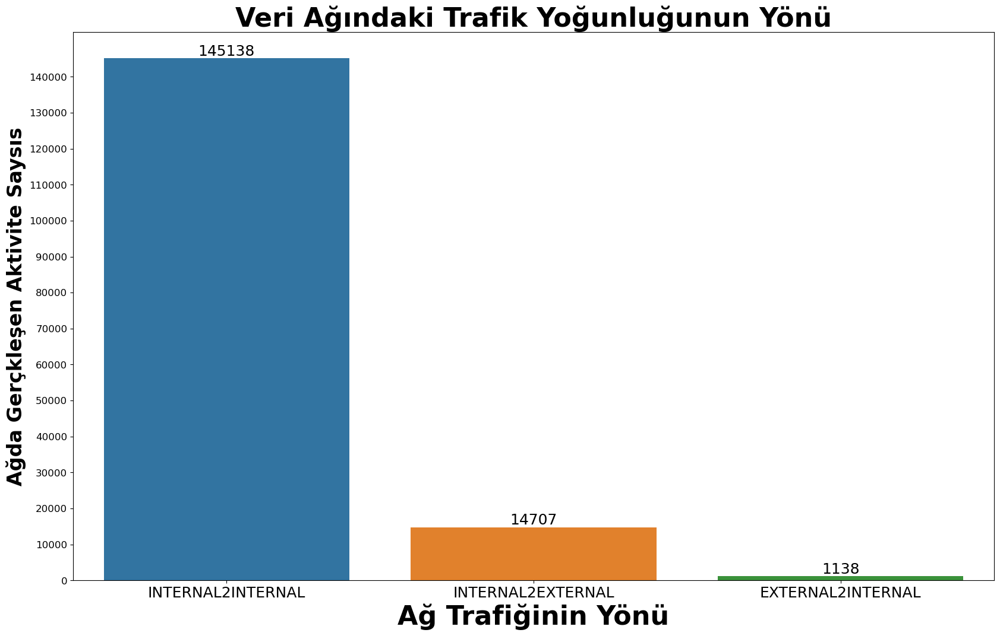

In [24]:
plt.figure(figsize = (20,12))
ax = sns.barplot(x = df['direction'].value_counts().index, y = df['direction'].value_counts().values, ci = None)
ax.bar_label(ax.containers[0], fontsize = 18)

plt.xlabel('Ağ Trafiğinin Yönü',fontsize = 32, fontweight = 'bold')
plt.xticks(fontsize =18)
plt.ylabel('Ağda Gerçkleşen Aktivite Saysıs',fontsize = 24, fontweight = 'bold')
plt.yticks(fontsize = 12)
ax.set_yticks(range(0,150000,10000))
plt.title('Veri Ağındaki Trafik Yoğunluğunun Yönü',fontsize = 32, fontweight = 'bold')
plt.show()

In [222]:
traffic_by_source = df.groupby('source_address').agg({
    'traffic_volume': 'sum',      # Replace 'traffic_volume' with the column name that stores traffic data
    'data_downloaded': 'sum'      # Replace 'data_downloaded' with the column name that stores data download information
}).reset_index()

# Sort by total traffic to identify the top IPs or domains
top_traffic_sources = traffic_by_source.sort_values(by='traffic_volume', ascending=False)

# Display the top 10 IPs or domains by traffic
print("Top IPs or domains by traffic volume:")
print(top_traffic_sources.head(10))

# Similarly, you can sort by 'data_downloaded' to identify the top downloaders
top_download_sources = traffic_by_source.sort_values(by='data_downloaded', ascending=False)

# Display the top 10 IPs or domains by data downloaded
print("Top IPs or domains by data downloaded:")
print(top_download_sources.head(10))

KeyError: "Column(s) ['data_downloaded', 'traffic_volume'] do not exist"

In [6]:
df.describe()

,source_port,destination_port,protocol,app_protocol,tunnel_source_address,tunnel_destination_address,tunnel_value,package_count,login_fail_count,login_success,expiration_id,priority,vlan_identifier,bidirectional_first_seen_ms,bidirectional_last_seen_ms,bidirectional_duration_ms,bidirectional_bytes,bidirectional_max_piat_ms,bidirectional_max_ps,bidirectional_mean_piat_ms,bidirectional_mean_ps,bidirectional_min_piat_ms,bidirectional_min_ps,bidirectional_packets,bidirectional_stddev_piat_ms,bidirectional_stddev_ps,bidirectional_syn_packets,bidirectional_cwr_packets,bidirectional_ece_packets,bidirectional_urg_packets,bidirectional_ack_packets,bidirectional_psh_packets,bidirectional_rst_packets,bidirectional_fin_packets,src2dst_first_seen_ms,src2dst_last_seen_ms,src2dst_duration_ms,src2dst_packets,src2dst_bytes,src2dst_max_piat_ms,src2dst_max_ps,src2dst_mean_piat_ms,src2dst_mean_ps,src2dst_min_piat_ms,src2dst_min_ps,src2dst_stddev_piat_ms,src2dst_stddev_ps,src2dst_syn_packets,src2dst_cwr_packets,src2dst_ece_packets,src2dst_urg_packets,src2dst_ack_packets,src2dst_psh_packets,src2dst_rst_packets,src2dst_fin_packets,dst2src_first_seen_ms,dst2src_last_seen_ms,dst2src_duration_ms,dst2src_packets,dst2src_bytes,dst2src_max_piat_ms,dst2src_max_ps,dst2src_mean_piat_ms,dst2src_mean_ps,dst2src_min_piat_ms,dst2src_min_ps,dst2src_stddev_piat_ms,dst2src_stddev_ps,dst2src_syn_packets,dst2src_cwr_packets,dst2src_ece_packets,dst2src_urg_packets,dst2src_ack_packets,dst2src_psh_packets,dst2src_rst_packets,dst2src_fin_packets,dns_query_len,dns_answer_len,dns_not_exist,dns_query_has_sub_domain,status_code,request_uri_arr,bidirectional_http_request_count,bidirectional_get_request_count,bidirectional_get_request_bytes,bidirectional_post_request_count,bidirectional_post_request_bytes,src2dst_get_request_bytes,src2dst_post_request_bytes,dst2src_get_request_bytes,dst2src_post_request_bytes,mail_recipient,server_side_using_capability,day,day_of_week,hour_of_day,location_id,nbns_conflict_count,ndr_name,source_asset_type,destination_asset_type
count,160983.000000,160983.000000,160983.000000,160983.000000,0.0,0.0,160983.000000,1.609830e+05,160983.000000,160983.000000,160983.000000,160983.0,160983.0,1.609830e+05,1.609830e+05,1.609830e+05,1.609830e+05,1.609830e+05,160983.000000,1.609830e+05,160983.000000,1.609830e+05,160983.000000,1.609830e+05,1.609830e+05,160983.000000,160983.000000,160983.000000,160983.000000,160983.0,1.609830e+05,160983.000000,160983.000000,160983.000000,1.609830e+05,1.609830e+05,1.609830e+05,1.609830e+05,1.609830e+05,1.609830e+05,160983.000000,1.609830e+05,160983.000000,1.609830e+05,160983.000000,160983.0,160983.000000,160983.000000,160983.000000,160983.000000,160983.0,1.609830e+05,160983.00000,160983.000000,160983.000000,1.609830e+05,1.609830e+05,1.609830e+05,1.609830e+05,1.609830e+05,1.609830e+05,160983.000000,1.609830e+05,160983.00000,1.609830e+05,160983.000000,1.609830e+05,160983.000000,160983.000000,160983.000000,160983.000000,160983.0,1.609830e+05,160983.000000,160983.000000,160983.000000,160983.000000,160983.000000,160983.000000,160983.000000,160983.000000,0.0,1.609830e+05,160983.000000,160983.000000,160983.000000,160983.000000,160983.000000,160983.000000,160983.000000,160983.0,0.0,0.0,160983.0,160983.0,160983.0,160983.0,160983.0,0.0,0.0,0.0
mean,44738.475659,4696.861911,9.538939,202.292404,NaN,NaN,4.061286,9.569397e+01,0.007113,0.024841,0.014741,0.0,0.0,1.710771e+15,1.710771e+15,9.313681e+06,8.607470e+04,4.211265e+06,311.868446,7.880633e+05,93.141376,6.052169e+04,23.068467,9.562267e+01,1.202573e+06,96.183022,1.455576,0.055484,0.104874,0.0,8.721682e+01,21.485219,0.153600,1.335520,1.588794e+15,1.588794e+15,9.244917e+06,3.444515e+01,2.300253e+04,4.175968e+06,174.345204,5.946094e+16,63.192018,1.190879e+06,23.727263,0.0,52.988059,0.750595,0.055472,0.055453,0.0,3.104768e+01,9.35592,0.054552,0.684575,1.575340e+15,1.575340e+15,8.837338e+06,6.117752e+01,6.307218e+04,4.033675e+06,264.896902,1.826233e+06,114.83605,1.184293e+06,51.665623,2.116897

In [7]:
df.shape

(160983, 165)

In [8]:
df.iloc[:,:100].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 160983 entries, 0 to 160982
Data columns (total 100 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   sync_name                     160983 non-null  object 
 1   source_address                160983 non-null  object 
 2   destination_address           160983 non-null  object 
 3   source_port                   160983 non-null  int64  
 4   destination_port              160983 non-null  int64  
 5   protocol                      160983 non-null  int64  
 6   app_protocol                  160983 non-null  int64  
 7   application_name              160983 non-null  object 
 8   application_category_name     160983 non-null  object 
 9   master_application_name       160983 non-null  object 
 10  tunnel_source_address         0 non-null       float64
 11  tunnel_destination_address    0 non-null       float64
 12  source_mac                    160983 non-nu

In [10]:
df.iloc[:,100:].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 160983 entries, 0 to 160982
Data columns (total 65 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   dns_answer_len                    160983 non-null  int64  
 1   dns_answer_type                   34251 non-null   object 
 2   dns_answer_addresses              3 non-null       object 
 3   dns_not_exist                     160983 non-null  int64  
 4   dns_server_direction              52693 non-null   object 
 5   dns_query_main_domain             47199 non-null   object 
 6   dns_query_sub_domain              45746 non-null   object 
 7   dns_query_has_sub_domain          160983 non-null  int64  
 8   DNS                               160983 non-null  object 
 9   status                            1480 non-null    object 
 10  status_code                       160983 non-null  int64  
 11  request_host                      899 non-null     o

In [145]:
df['application_name'].value_counts()

Zabbix          58677
DNS             35901
ARP-Request      9319
TLS              8771
DNS.Google       5505
                ...  
QUIC.Discord        1
POP3                1
TiVoConnect         1
LLMNR               1
TLS.GitLab          1
Name: application_name, Length: 212, dtype: int64

In [8]:
list(df.columns)

['sync_name',
 'source_address',
 'destination_address',
 'source_port',
 'destination_port',
 'protocol',
 'app_protocol',
 'application_name',
 'application_category_name',
 'master_application_name',
 'tunnel_source_address',
 'tunnel_destination_address',
 'source_mac',
 'destination_mac',
 'tunnel_value',
 'package_count',
 'login_fail_count',
 'login_success',
 'expiration_id',
 'drop_eligible',
 'priority',
 'vlan_identifier',
 'event_time',
 'bidirectional_first_seen_ms',
 'bidirectional_last_seen_ms',
 'bidirectional_duration_ms',
 'bidirectional_bytes',
 'bidirectional_max_piat_ms',
 'bidirectional_max_ps',
 'bidirectional_mean_piat_ms',
 'bidirectional_mean_ps',
 'bidirectional_min_piat_ms',
 'bidirectional_min_ps',
 'bidirectional_packets',
 'bidirectional_stddev_piat_ms',
 'bidirectional_stddev_ps',
 'bidirectional_syn_packets',
 'bidirectional_cwr_packets',
 'bidirectional_ece_packets',
 'bidirectional_urg_packets',
 'bidirectional_ack_packets',
 'bidirectional_psh_packet

In [11]:
#Login Failed source_adresses
df['source_address'][df['login_fail_count']==1].value_counts()

10.1.78.24        940
10.212.134.77      20
10.81.0.122         2
192.168.30.184      2
10.110.10.38        2
                 ... 
192.168.30.123      1
10.61.0.145         1
10.110.10.26        1
10.81.0.132         1
10.110.10.28        1
Name: source_address, Length: 162, dtype: int64

In [25]:
df.groupby(['source_address','login_fail_count']).count().sort_index()

,,sync_name,destination_address,source_port,destination_port,protocol,app_protocol,application_name,application_category_name,master_application_name,tunnel_source_address,tunnel_destination_address,source_mac,destination_mac,tunnel_value,package_count,login_success,expiration_id,drop_eligible,priority,vlan_identifier,event_time,bidirectional_first_seen_ms,bidirectional_last_seen_ms,bidirectional_duration_ms,bidirectional_bytes,bidirectional_max_piat_ms,bidirectional_max_ps,bidirectional_mean_piat_ms,bidirectional_mean_ps,bidirectional_min_piat_ms,bidirectional_min_ps,bidirectional_packets,bidirectional_stddev_piat_ms,bidirectional_stddev_ps,bidirectional_syn_packets,bidirectional_cwr_packets,bidirectional_ece_packets,bidirectional_urg_packets,bidirectional_ack_packets,bidirectional_psh_packets,bidirectional_rst_packets,bidirectional_fin_packets,src2dst_first_seen_ms,src2dst_last_seen_ms,src2dst_duration_ms,src2dst_packets,src2dst_bytes,src2dst_max_piat_ms,src2dst_max_ps,src2dst_mean_piat_ms,src2dst_mean_ps,src2dst_min_piat_ms,src2dst_min_ps,src2dst_stddev_piat_ms,src2dst_stddev_ps,src2dst_syn_packets,src2dst_cwr_packets,src2dst_ece_packets,src2dst_urg_packets,src2dst_ack_packets,src2dst_psh_packets,src2dst_rst_packets,src2dst_fin_packets,dst2src_first_seen_ms,dst2src_last_seen_ms,dst2src_duration_ms,dst2src_packets,dst2src_bytes,dst2src_max_piat_ms,dst2src_max_ps,dst2src_mean_piat_ms,dst2src_mean_ps,dst2src_min_piat_ms,dst2src_min_ps,dst2src_stddev_piat_ms,dst2src_stddev_ps,dst2src_syn_packets,dst2src_cwr_packets,dst2src_ece_packets,dst2src_urg_packets,dst2src_ack_packets,dst2src_psh_packets,dst2src_rst_packets,dst2src_fin_packets,is_username,username,username_arr,is_hostname,source_hostname,source_hostname_arr,destination_hostname,destination_hostname_arr,domain,domain_arr,dns_query_name,dns_query_len,dns_query_type,dns_answer_name,dns_answer_len,dns_answer_type,dns_answer_addresses,dns_not_exist,dns_server_direction,dns_query_main_domain,dns_query_sub_domain,dns_query_has_sub_domain,DNS,status,status_code,request_host,request_type,request_uri,request_uri_arr,user_agent,first_http_post_body,http_request,bidirectional_http_request_count,bidirectional_get_request_count,bidirectional_get_request_bytes,bidirectional_post_request_count,bidirectional_post_request_bytes,src2dst_get_request_bytes,src2dst_post_request_bytes,dst2src_get_request_bytes,dst2src_post_request_bytes,HTTP,ja3_client,ja3_server,mail_sender,mail_recipient,file_transport,ntlmssp_auth_seen,LdapUserInfo,ICMP,SMB2Status,Flow_Risks,Kerberos,server_side_using_capability,UserBehavior,personnel_info,DeviceOnNetwork,direction,day,day_of_week,hour_of_day,location_id,bidirectional_first_seen_ms_ts,bidirectional_last_seen_ms_ts,sourceCountry,destinationCountry,sourceGeoPoint,destinationGeoPoint,src_asn,dst_asn,nbns_conflict_count,ndr_name,source_type,destination_type,session_id,session_id_from_time,protocol_name,source_asset_type,destination_asset_type
source_address,login_fail_count,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
10.1.101.10,0,108,108,108,108,108,108,108,108,108,0,0,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,37,108,108,29,108,29,27,108,27,0,108,29,29,29,108,108,1,108,1,75,1,0,1,0,1,108,108,108,108,108,108,108,108,108,108,0,0,108,0,108,108,108,108,108,108,108,0,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,0,108,108,108,108,108,0,0
10.1.40.100,0,728,728,728,728,728,728,728,728,728,0,0,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728,728

In [13]:
#Login failed destinatioon  adresses
df['destination_address'][df['source_address'] == '10.1.78.24'].value_counts()

10.1.78.10     2057
10.1.78.254      15
10.1.78.98        2
10.1.78.145       2
10.1.78.222       2
               ... 
10.1.78.21        1
10.1.78.11        1
10.1.78.12        1
10.1.40.100       1
10.1.78.22        1
Name: destination_address, Length: 257, dtype: int64

In [26]:
#The top login login failed source adress 940 time attend to login top failed dsetination address
df['destination_address'][(df['source_address'] == '10.1.78.24')&(df['login_fail_count']==1)].value_counts()

10.1.78.10    940
Name: destination_address, dtype: int64

In [9]:
df[['source_address','destination_address']].isnull().sum()

source_address         0
destination_address    0
dtype: int64

In [10]:
df['source_address'].value_counts(dropna =False)

10.1.66.175       29137
10.1.68.100       27432
10.1.68.210        9145
10.10.100.100      8068
10.1.51.60         4669
                  ...  
10.1.40.206           1
106.53.74.140         1
111.56.54.202         1
109.206.237.58        1
152.32.141.172        1
Name: source_address, Length: 956, dtype: int64

In [144]:
df.groupby(['source_address']).count().sort_values(by = 'sync_name', ascending = False)

,sync_name,destination_address,source_port,destination_port,protocol,app_protocol,application_name,application_category_name,master_application_name,tunnel_source_address,tunnel_destination_address,source_mac,destination_mac,tunnel_value,package_count,login_fail_count,login_success,expiration_id,drop_eligible,priority,vlan_identifier,event_time,bidirectional_first_seen_ms,bidirectional_last_seen_ms,bidirectional_duration_ms,bidirectional_bytes,bidirectional_max_piat_ms,bidirectional_max_ps,bidirectional_mean_piat_ms,bidirectional_mean_ps,bidirectional_min_piat_ms,bidirectional_min_ps,bidirectional_packets,bidirectional_stddev_piat_ms,bidirectional_stddev_ps,bidirectional_syn_packets,bidirectional_cwr_packets,bidirectional_ece_packets,bidirectional_urg_packets,bidirectional_ack_packets,bidirectional_psh_packets,bidirectional_rst_packets,bidirectional_fin_packets,src2dst_first_seen_ms,src2dst_last_seen_ms,src2dst_duration_ms,src2dst_packets,src2dst_bytes,src2dst_max_piat_ms,src2dst_max_ps,src2dst_mean_piat_ms,src2dst_mean_ps,src2dst_min_piat_ms,src2dst_min_ps,src2dst_stddev_piat_ms,src2dst_stddev_ps,src2dst_syn_packets,src2dst_cwr_packets,src2dst_ece_packets,src2dst_urg_packets,src2dst_ack_packets,src2dst_psh_packets,src2dst_rst_packets,src2dst_fin_packets,dst2src_first_seen_ms,dst2src_last_seen_ms,dst2src_duration_ms,dst2src_packets,dst2src_bytes,dst2src_max_piat_ms,dst2src_max_ps,dst2src_mean_piat_ms,dst2src_mean_ps,dst2src_min_piat_ms,dst2src_min_ps,dst2src_stddev_piat_ms,dst2src_stddev_ps,dst2src_syn_packets,dst2src_cwr_packets,dst2src_ece_packets,dst2src_urg_packets,dst2src_ack_packets,dst2src_psh_packets,dst2src_rst_packets,dst2src_fin_packets,is_username,username,username_arr,is_hostname,source_hostname,source_hostname_arr,destination_hostname,destination_hostname_arr,domain,domain_arr,dns_query_name,dns_query_len,dns_query_type,dns_answer_name,dns_answer_len,dns_answer_type,dns_answer_addresses,dns_not_exist,dns_server_direction,dns_query_main_domain,dns_query_sub_domain,dns_query_has_sub_domain,DNS,status,status_code,request_host,request_type,request_uri,request_uri_arr,user_agent,first_http_post_body,http_request,bidirectional_http_request_count,bidirectional_get_request_count,bidirectional_get_request_bytes,bidirectional_post_request_count,bidirectional_post_request_bytes,src2dst_get_request_bytes,src2dst_post_request_bytes,dst2src_get_request_bytes,dst2src_post_request_bytes,HTTP,ja3_client,ja3_server,mail_sender,mail_recipient,file_transport,ntlmssp_auth_seen,LdapUserInfo,ICMP,SMB2Status,Flow_Risks,Kerberos,server_side_using_capability,UserBehavior,personnel_info,DeviceOnNetwork,direction,day,day_of_week,hour_of_day,location_id,bidirectional_first_seen_ms_ts,bidirectional_last_seen_ms_ts,sourceCountry,destinationCountry,sourceGeoPoint,destinationGeoPoint,src_asn,dst_asn,nbns_conflict_count,ndr_name,source_type,destination_type,session_id,session_id_from_time,protocol_name,source_asset_type,destination_asset_type,minutes,minute,count
source_address,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
10.1.66.175,29137,29137,29137,29137,29137,29137,29137,29137,29137,0,0,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,10,29137,29137,10,29137,10,10,29137,10,0,29137,10,10,6,29137,29137,3,29137,3,27339,57,0,3,0,57,29137,29137,29137,29137,29137,29137,29137,29137,29137,29137,649,649,29137,0,29137,29137,29137,29137,29137,29137,29137,0,29137,29137,29137,29137,29137,29137,29137,29137,2

In [267]:
df['event_time'] = pd.to_datetime(df['event_time'])

In [150]:
df['minute_second'] = df['event_time'].dt.strftime('%M:%S')

In [268]:
df['minutes'] = df.event_time.dt.minute

In [ ]:
df[['source_address','destination_address']].count()

In [ ]:
dense_source  = df.groupby('source_address')['source_address'].count().sort_values(ascending=False)

In [ ]:
dense_source[dense_source.values>100].count()

In [ ]:
sns.barplot(x = df.groupby('source_address')['source_address'].count().index, y=df.groupby('source_address')['source_address'].count().values)

Öncelikle event_time sütunumuzu birimlerine ayırdığımızda bu datanın 18 Mart 2024 tarihine ait bir data oldugu
Veri trafiğinin bu tarihte saat 14 e ait olduğu görülmüştür.

In [ ]:
df['hour_of_day'].value_counts().sort_values(ascending=False)

In [ ]:
df.event_time.dt.year.value_counts()

In [ ]:
df.event_time.dt.month.value_counts()

In [ ]:
df.event_time.dt.day.value_counts()

In [ ]:
df.event_time.dt.hour.value_counts()

In [ ]:
df.event_time.dt.year.value_counts()

In [ ]:
df.event_time.dt.minute.value_counts().sort_index()

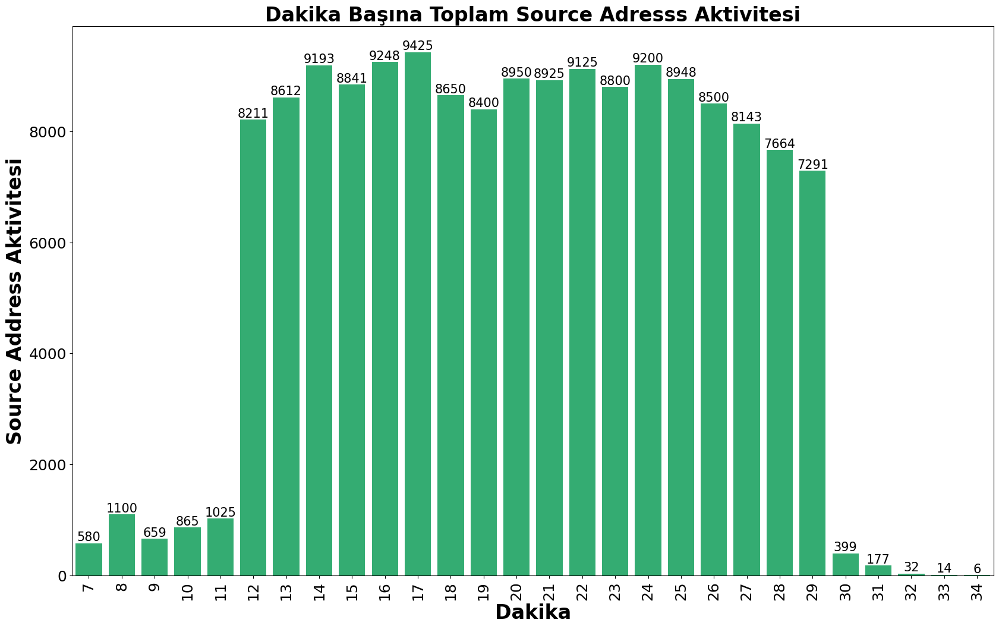

In [29]:
plt.figure(figsize = (20,12))
ax = sns.barplot(x = df['minutes'].value_counts().index, y = df['minutes'].value_counts().values,color = '#20c073')
ax.bar_label(ax.containers[0],fontsize = 15)
plt.xticks(rotation = 90,fontsize = 18)
plt.yticks(fontsize = 18)
plt.ylabel('Source Address Aktivitesi',fontsize=24,fontweight='bold')
plt.xlabel('Dakika',fontsize = 24,fontweight='bold')
plt.title('Dakika Başına Toplam Source Adresss Aktivitesi',fontsize = 24,fontweight='bold')
plt.show()

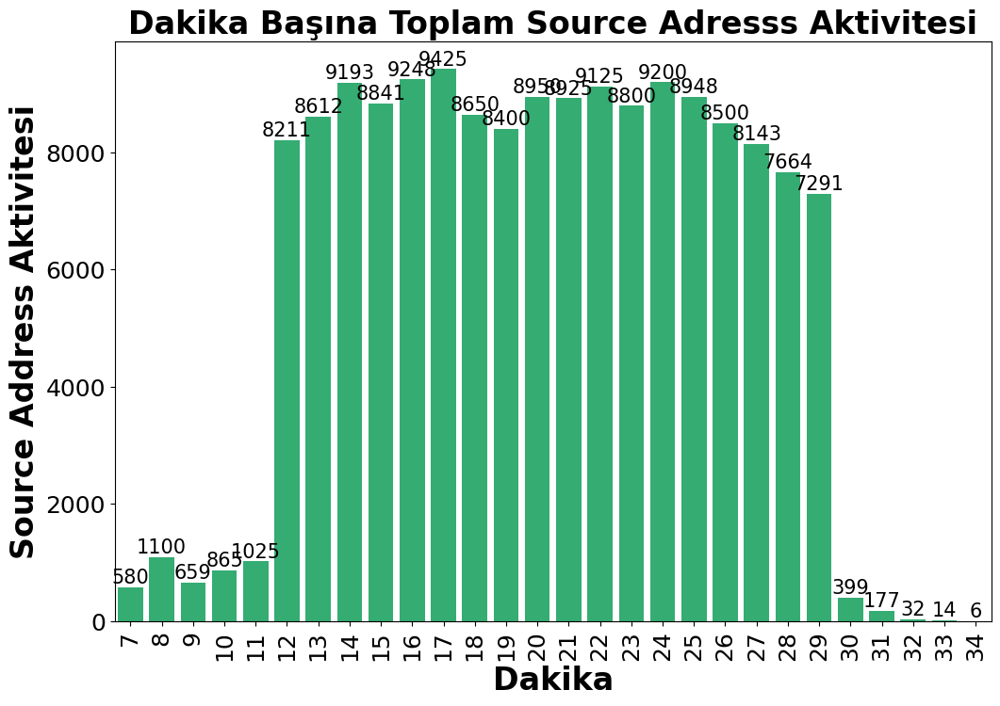

In [28]:
plt.figure(figsize = (12,8))
ax = sns.barplot(x = df['minutes'].value_counts().index, y = df['minutes'].value_counts().values,color = '#20c073')
ax.bar_label(ax.containers[0],fontsize = 15)
plt.xticks(rotation = 90,fontsize = 18)
plt.yticks(fontsize = 18)
plt.ylabel('Source Address Aktivitesi',fontsize=24,fontweight='bold')
plt.xlabel('Dakika',fontsize = 24,fontweight='bold')
plt.title('Dakika Başına Toplam Source Adresss Aktivitesi',fontsize = 24,fontweight='bold')
plt.show()

In [27]:
plt.figure(figsize = (20,12))
ax = sns.barplot(x = df['minutes'].sort_index().index, y = df.event_time.dt.minute.value_counts().sort_index().values,palette='viridis')
ax.bar_label(ax.containers[0])
plt.xticks(rotation = 90)
plt.show()

KeyError: 'minutes'

<Figure size 2000x1200 with 0 Axes>

In [26]:
df['minutes'] = df.event_time.dt.minute

In [ ]:
df.groupby(['minutes','source_address'])['source_address'].count().sort_values(ascending =False)

In [ ]:
groupby_minsource = df.groupby(['minutes','source_address'])['source_address'].count().sort_index(ascending = False).sort_values(ascending =False)

In [ ]:
sns.lineplot(x = df['event_time'].)

In [ ]:
groupby_minsource[groupby_minsource.values>10]

In [ ]:
groupby_minsource

In [30]:
groupby_sourcemin = df.groupby(['source_address','minutes'])['minutes'].count().sort_values(ascending =False)

In [31]:
groupby_destmin = df.groupby(['destination_address','minutes'])['minutes'].count().sort_values(ascending =False)

In [32]:
groupby_sourcedest = df.groupby(['source_address','destination_address','minutes'])['minutes'].count().sort_values(ascending =False)

source_address  destination_address  minutes
10.1.78.24      10.1.78.10           14         1051
10.1.68.100     10.10.101.10         26          942
                                     18          922
                                     24          890
                                     15          883
                                                ... 
10.10.111.11    192.168.63.45        18            1
                                     15            1
                                     12            1
                192.168.63.41        17            1
95.214.55.244   10.1.71.10           25            1
Name: minutes, Length: 14698, dtype: int64

In [33]:
df_reset_sourcemin = groupby_sourcemin.reset_index(name = 'values')

In [34]:
df_reset_destmin = groupby_destmin.reset_index(name = 'values')

In [35]:
df_reset_sourcedest = groupby_sourcedest.reset_index(name = 'values') 

,source_address,destination_address,minutes,values
0,10.1.78.24,10.1.78.10,14,1051
1,10.1.68.100,10.10.101.10,26,942
2,10.1.68.100,10.10.101.10,18,922
3,10.1.68.100,10.10.101.10,24,890
4,10.1.68.100,10.10.101.10,15,883
...,...,...,...,...
14693,10.10.111.11,192.168.63.45,18,1
14694,10.10.111.11,192.168.63.45,15,1
14695,10.10.111.11,192.168.63.45,12,1
14696,10.10.111.11,192.168.63.41,17,1


## df_sourcemin

In [ ]:
df_sourcemin.columns = ['source_address', 'minute', 'count']

In [ ]:
df_sourcemin

In [ ]:
sns.barplot(x = groupby_sourcemin[groupby_sourcemin.values>1000].index,y = groupby_sourcemin[groupby_sourcemin.values>1000].values)

In [ ]:
groupby_sourcemin[groupby_sourcemin.values>1000].values

In [ ]:
dfx = groupby_sourcemin[groupby_sourcemin.values > 1000].reset_index()

In [ ]:
groupby_sourcemin[groupby_sourcemin.values > 1000].reset_index_index()

In [ ]:
df['login_fail_count'].value_counts()

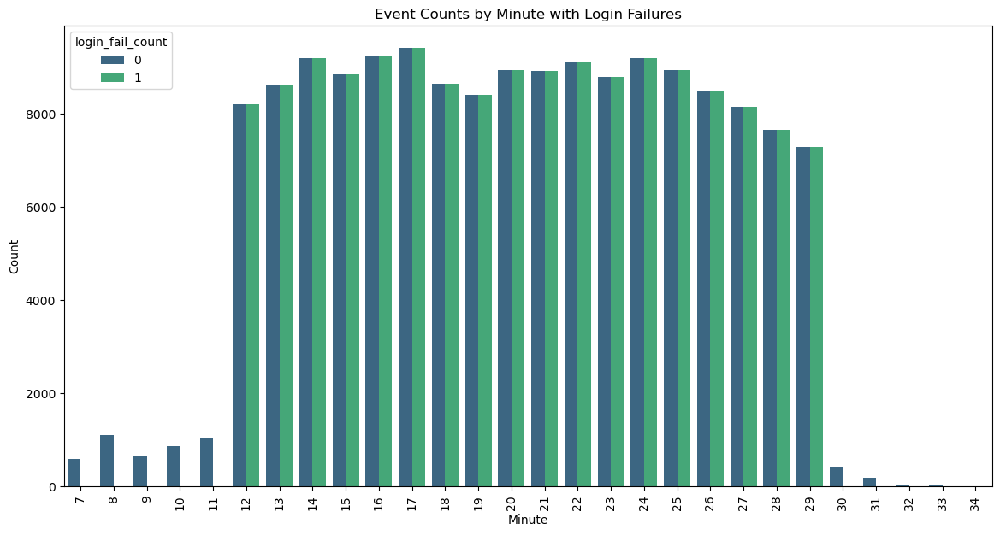

In [33]:
minute_counts = df['event_time'].dt.minute.value_counts().sort_index()

# Create a DataFrame with minute and corresponding counts
minute_df = pd.DataFrame({'minute': minute_counts.index, 'count': minute_counts.values})

# Merge this with the original DataFrame on the minute
df = df.merge(minute_df, left_on=df['event_time'].dt.minute, right_on='minute', how='left')

plt.figure(figsize=(14, 7))

# Create the bar plot
sns.barplot(x='minute', y='count', data=df, palette='viridis', hue='login_fail_count')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=90)

# Set plot title and labels
plt.title('Event Counts by Minute with Login Failures')
plt.xlabel('Minute')
plt.ylabel('Count')

# Display the plot
plt.show()


In [131]:
df[df['login_fail_count']==1].groupby(['source_address','minutes','login_fail_count'])['minutes'].count().reset_index(name = 'values').sort_values(by = 'values',ascending =False)

,source_address,minutes,login_fail_count,values
4,10.1.78.24,17,1,657
3,10.1.78.24,16,1,283
48,10.212.134.77,23,1,4
44,10.212.134.77,19,1,4
46,10.212.134.77,21,1,4
...,...,...,...,...
73,10.61.0.172,28,1,1
74,10.61.0.173,25,1,1
75,10.61.0.179,24,1,1
76,10.61.0.181,17,1,1


In [262]:
df['source_address']

0         192.168.2.100
1          10.10.10.140
2          10.10.92.254
3            10.1.66.11
4         10.10.107.254
              ...      
160978    10.10.100.100
160979    10.10.100.100
160980     10.110.10.42
160981    10.10.100.100
160982      10.1.68.100
Name: source_address, Length: 160983, dtype: object

In [263]:
df.groupby(['source_address','minutes','login_fail_count'])['minutes'].count().reset_index(name = 'values').sort_values(by = 'values',ascending =False)

KeyError: 'minutes'

C:\Users\manai\AppData\Local\Temp\ipykernel_4372\3602310864.py:3: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




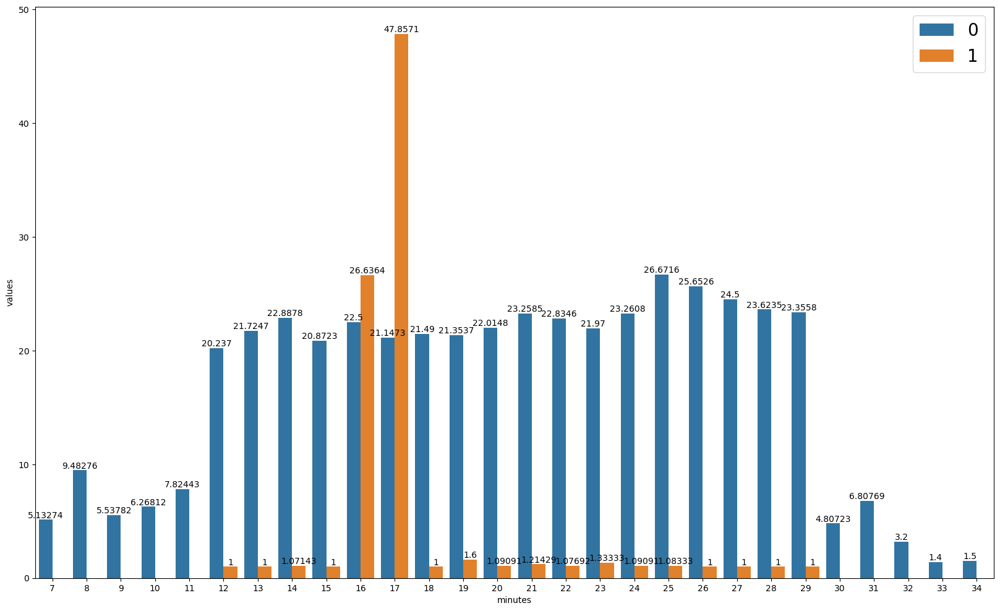

In [126]:
plt.figure(figsize = (20,12))

ax = sns.barplot(df.groupby(['source_address','minutes','login_fail_count'])['minutes'].count().reset_index(name = 'values').sort_values(by = 'values',ascending =False),
            x ='minutes',
            y = 'values',
           hue = 'login_fail_count',
           ci = None)

for container in ax.containers:
    ax.bar_label(container)

"""for container in ax.containers:
    ax.bar_label(container, rotation =70, padding=2)"""
    

    
plt.legend( loc = 1,fontsize =20)
plt.show()

C:\Users\manai\AppData\Local\Temp\ipykernel_4372\1492727881.py:11: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




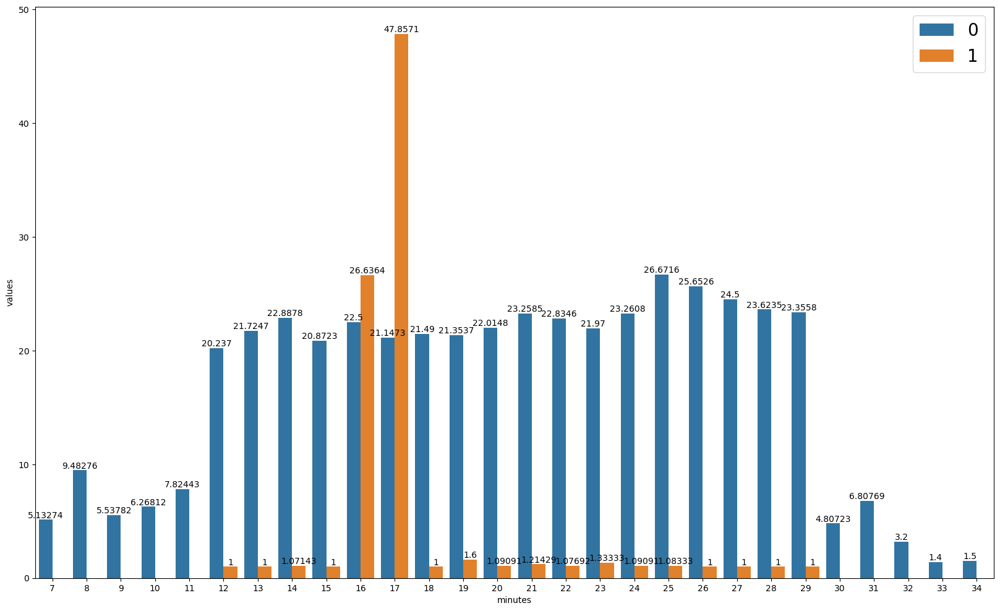

In [100]:
df[df['login_fail_count']==1]['login_fail_count'].count()

1145

In [193]:
df[df['login_fail_count']==1]['source_address'].value_counts()

10.1.78.24        940
10.212.134.77      20
10.81.0.122         2
192.168.30.184      2
10.110.10.38        2
                 ... 
192.168.30.123      1
10.61.0.145         1
10.110.10.26        1
10.81.0.132         1
10.110.10.28        1
Name: source_address, Length: 162, dtype: int64

In [235]:
df[df['login_fail_count']==1][['destination_address','minutes']].value_counts().reset_index(name = 'counts').sort_values(by=['destination_address','minutes'])

,destination_address,minutes,counts
34,10.1.44.101,17,1
27,10.1.71.10,12,1
33,10.1.71.10,14,1
32,10.1.71.10,23,1
1,10.1.78.10,16,283
0,10.1.78.10,17,657
22,10.1.78.12,19,4
26,10.1.78.12,20,2
21,10.1.78.12,21,4
25,10.1.78.12,22,2


In [209]:
df[df['login_fail_count']==1].groupby(['source_address','destination_address'])[['source_address','destination_address']].count().reset_index()

ValueError: cannot insert destination_address, already exists

In [57]:
df[(df['minutes'].isin([16,17]))&(df['login_fail_count']==1)][['source_address','minutes']].value_counts().sort_values(ascending=False)

source_address  minutes
10.1.78.24      17         657
                16         283
10.61.0.97      17           1
10.10.82.81     17           1
10.110.10.35    16           1
10.110.10.75    17           1
10.165.3.210    17           1
10.212.134.147  17           1
10.60.1.75      16           1
10.61.0.181     17           1
10.61.0.194     17           1
10.61.0.54      16           1
10.81.0.116     16           1
10.83.1.39      16           1
10.83.1.40      16           1
172.16.202.190  16           1
172.16.203.90   17           1
192.168.23.23   16           1
                17           1
192.168.30.184  17           1
192.168.30.201  16           1
                17           1
10.81.0.99      17           1
10.1.44.100     17           1
192.168.63.51   16           1
dtype: int64

In [22]:
 groupby_sourcemin


source_address  minutes
10.1.68.100     26         1693
10.1.66.175     15         1688
                24         1666
                21         1651
                27         1649
                           ... 
10.61.0.130     19            1
10.61.0.135     20            1
                24            1
10.61.0.145     20            1
95.214.55.244   25            1
Name: minutes, Length: 7697, dtype: int64

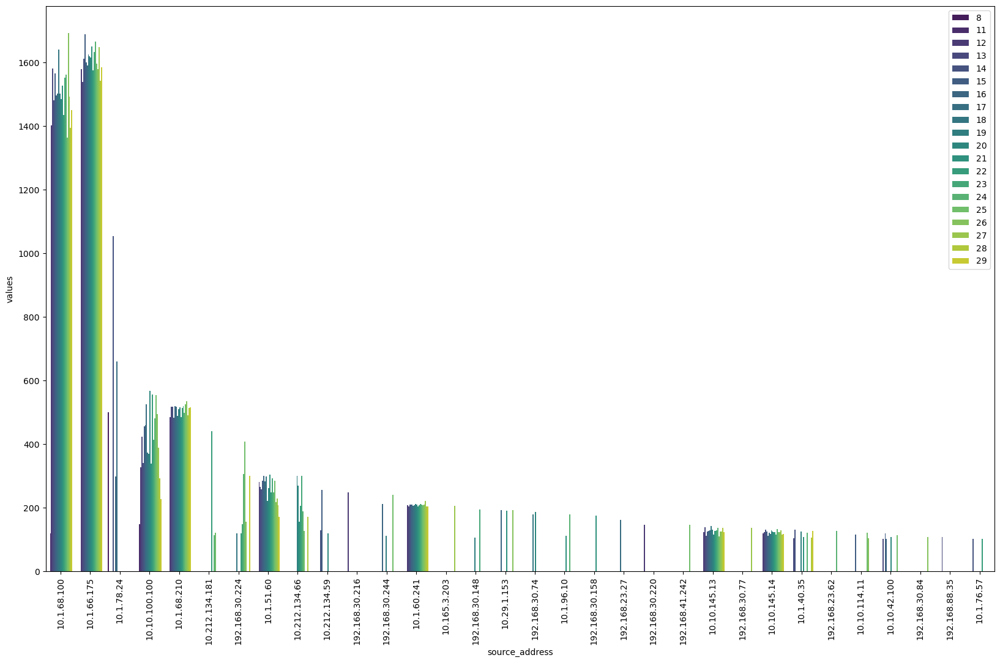

In [44]:

plt.figure(figsize= (20,12))
# Create the bar plot
sns.barplot(x='source_address', y='values', hue='minutes', data=df_reset[df_reset['values']>100], palette='viridis')

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)
plt.legend(loc = 1)

# Show the plot
plt.show()

In [39]:
groupby_destmin = df.groupby(['destination_address','minutes'])['minutes'].count().sort_values(ascending =False)

In [40]:
df_reset_destmin = groupby_destmin.reset_index(name = 'values')

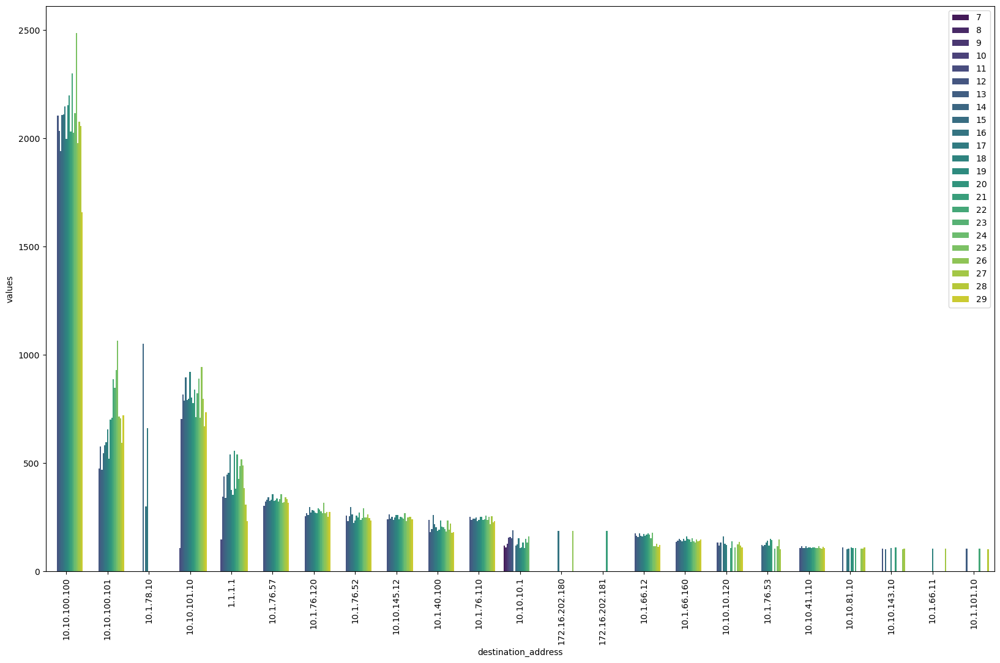

In [16]:
plt.figure(figsize= (20,12))
# Create the bar plot
sns.barplot(x='destination_address', y='values', hue='minutes', data=df_reset_destmin[df_reset_destmin['values']>100], palette='viridis')

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)
plt.legend(loc = 1)

# Show the plot
plt.show()

In [31]:
df_reset = groupby_sourcemin.reset_index(name = 'values')

In [34]:
df_reset[df_reset['values']>100]

,source_address,minutes,values
0,10.1.68.100,26,1693
1,10.1.66.175,15,1688
2,10.1.66.175,24,1666
3,10.1.66.175,21,1651
4,10.1.66.175,27,1649
...,...,...,...
205,10.1.40.35,13,103
206,10.10.42.100,16,102
207,10.10.42.100,13,101
208,10.1.76.57,14,101


In [41]:
df_reset[df_reset['values']>100].nunique()

source_address     32
minutes            20
values            150
dtype: int64

In [20]:
df.groupby(['source_address','destination_address']).count()

sync_name  source_port  destination_port  \
source_address destination_address                                             
10.1.101.10    10.10.100.100               18           18                18   
               10.10.100.101               16           16                16   
               10.10.107.13                71           71                71   
               10.10.111.11                 3            3                 3   
10.1.40.100    10.1.40.1                    1            1                 1   
...                                       ...          ...               ...   
93.122.157.85  10.1.71.10                   3            3                 3   
93.190.8.77    10.1.71.10                   1            1                 1   
94.156.66.75   10.1.71.10                   1            1                 1   
95.101.23.205  10.1.96.10                   1            1                 1   
95.214.55.244  10.1.71.10                   1            1                 1   

                                    protocol  app_protocol  application_name  \
source_address destination_address                                             
10.1.101.10    10.10.100.100              18            18                18   
               10.10.100.101              16            16                16   
               10.10.107.13               71            71                71   
               10.10.111.11                3             3                 3   
10.1.40.100    10.1.40.1                   1             1                 1   
...                                      ...           ...               ...   
93.122.157.85  10.1.71.10                  3             3                 3   
93.190.8.77    10.1.71.10                  1             1                 1   
94.156.66.75   10.1.71.10                  1             1                 1   
95.101.23.205  10.1.96.10                  1             1                 1   
95.214.55.244  10.1.71.10                  1             1                 1   

                                    application_category_name  \
source_address destination_address                              
10.1.101.10    10.10.100.100                               18   
               10.10.100.101                               16   
               10.10.107.13                                71   
               10.10.111.11                                 3   
10.1.40.100    10.1.40.1                                    1   
...                                                       ...   
93.122.157.85  10.1.71.10                                   3   
93.190.8.77    10.1.71.10                                   1   
94.156.66.75   10.1.71.10                                   1   
95.101.23.205  10.1.96.10                                   1   
95.214.55.244  10.1.71.10                                   1   

                                    master_application_name  \
source_address destination_address                            
10.1.101.10    10.10.100.100                             18   
               10.10.100.101                             16   
               10.10.107.13                              71   
               10.10.111.11                               3   
10.1.40.100    10.1.40.1                                  1   
...                                                     ...   
93.122.157.85  10.1.71.10                                 3   
93.190.8.77    10.1.71.10                                 1   
94.156.66.75   10.1.71.10                                 1   
95.101.23.205  10.1.96.10                                 1   
95.214.55.244  10.1.71.10                                 1   

                                    tunnel_source_address  \
source_address destination_address                          
10.1.101.10    10.10.100.100                            0   
               10.10.100.101                            0   
               10.10.107.13                 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


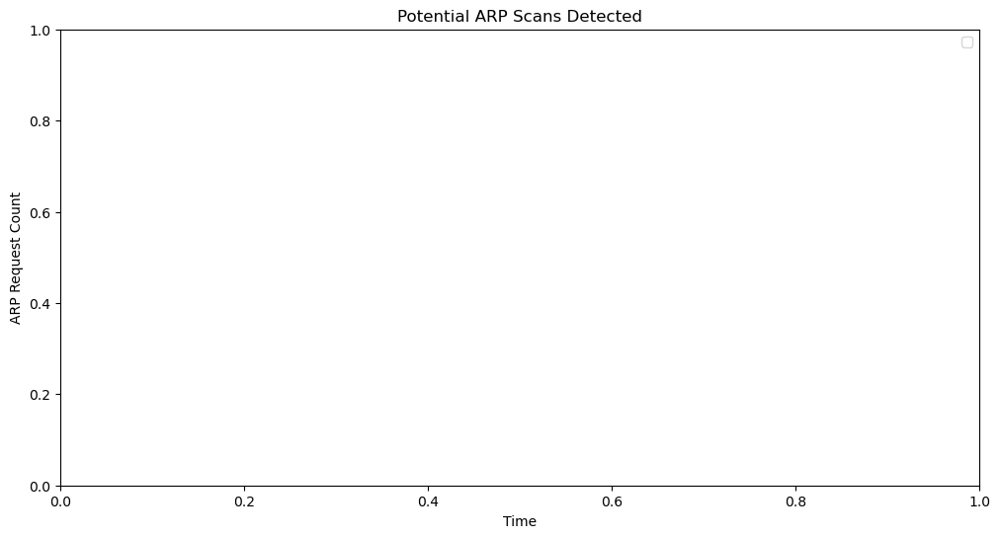

In [18]:
arp_traffic = df[df['protocol'] == 'ARP']

# Group by source address and time window to detect spikes in ARP requests
arp_counts = arp_traffic.groupby(['source_address', pd.Grouper(key='event_time', freq='1T')]).size().reset_index(name='arp_count')

# Identify sources with high ARP counts (threshold based on your network baseline)
threshold = 50
potential_scans = arp_counts[arp_counts['arp_count'] > threshold]

# Plot the ARP requests over time
plt.figure(figsize=(12, 6))
for source in potential_scans['source_address'].unique():
    source_data = potential_scans[potential_scans['source_address'] == source]
    plt.plot(source_data['event_time'], source_data['arp_count'], label=source)

plt.xlabel('Time')
plt.ylabel('ARP Request Count')
plt.title('Potential ARP Scans Detected')
plt.legend()
plt.show()

In [19]:
df[df['protocol'] == 'ARP'].value_counts()

Series([], dtype: int64)

In [20]:
import os

In [21]:
os.getcwd()

'C:\\Users\\Admin\\OneDrive\\Desktop\\TECHPRO\\GitPortf\\Portfolio\\ML\\Classification Models\\NextRay'

<AxesSubplot:xlabel='minutes', ylabel='values'>

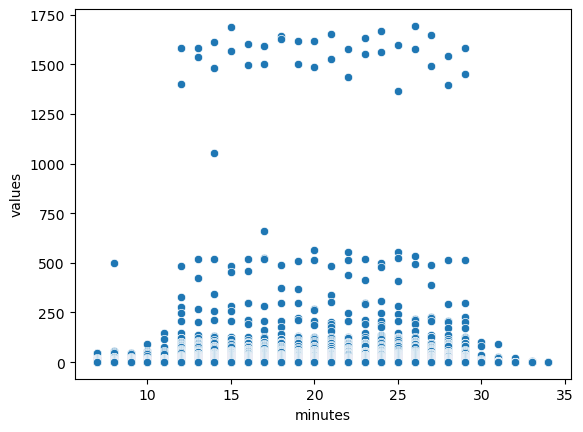

In [32]:
sns.scatterplot(data =df_reset, x = 'minutes',y = 'values' )

In [37]:
import plotly.express as px

In [39]:
fig = px.scatter(df_reset_sourcemin[df_reset_sourcemin['values']>400], 
                 x='minutes', 
                 y='values', 
                 size='values', 
                 color='source_address',
                 hover_name='source_address',  # Add hover information
                 title='Interactive Bubble Chart of Minutes vs. Values',
                 labels={'minutes':'Minutes', 'values':'Values'},
                 size_max=25)  # Maximum size of bubbles

# Show the plot
plt.title('Source Addres&Dakika Aktivite Grafiği')
plt.xlabe('DAKİKA')
        
fig.show()

SyntaxError: invalid syntax (998707095.py, line 14)

In [81]:
fig = px.scatter(df_reset_destmin[df_reset_destmin['values']>500], 
                 x='minutes', 
                 y='values', 
                 size='values',
                 hover_name='destination_address',  # Add hover information
                 title='Interactive Bubble Chart of Minutes vs. Values',
                 labels={'minutes':'Minutes', 'values':'Values'},
                 size_max= 25,
                 color="average",
                        size="average", color_continuous_scale=px.colors.sequential.matter, size_max=20,
                        zoom=5, height=1000, mapbox_style="open-street-map")  # Maximum size of bubbles

# Show the plot
fig.show()

SyntaxError: keyword argument repeated: size (2224055827.py, line 10)

In [36]:
fig = px.scatter(df_reset_sourcedest[df_reset_sourcedest['values']>100], 
                 x='minutes', 
                 y='values', 
                 size='values', 
                 color=['source_address','destination_address'],
                 hover_name='destination_address',  # Add hover information
                 title='Interactive Bubble Chart of Minutes vs. Values',
                 labels={'minutes':'Minutes', 'values':'Values'},
                 size_max=25)  # Maximum size of bubbles

# Show the plot
fig.show()

<IPython.core.display.Javascript object>

ValueError: All arguments should have the same length. The length of argument `color` is 2, whereas the length of  previously-processed arguments ['minutes', 'values', 'destination_address'] is 303

In [84]:
df_combined = pd.merge(df_reset, df_reset_destmin, on=['minutes', 'values'], how='outer', suffixes=('_source', '_dest'))
df_combined['address_combined'] = df_combined['source_address'].fillna('') + ' - ' + df_combined['destination_address'].fillna('')

# Plotly bubble chart
fig = px.scatter(df_combined, 
                 x='minutes', 
                 y='values', 
                 size='values', 
                 color='address_combined', 
                 hover_name='address_combined',
                 labels={'address_combined': 'Source-Destination Address'})

fig.update_layout(title='Bubble Chart with Source and Destination Address',
                  xaxis_title='Minutes',
                  yaxis_title='Values',
                  legend_title='Address')

fig.show()

NameError: name 'df_reset' is not defined

In [110]:
plt.figure(figsize = (30,16))
df_reset_sourcedest['source_dest_combo'] = df_reset_sourcedest['source_address'] + ' -->>>> ' + df_reset_sourcedest['destination_address']

# Step 2: Create the bubble chart with Plotly
fig = px.scatter(
    df_reset_sourcedest[df_reset_sourcedest['values']>150],
    x='minutes',
    y='values',
    size='values',  # Bubble size
    color='source_dest_combo',  # Color by source-destination combo
    hover_name='source_dest_combo',  # Show source-destination on hover
    title='Bubble Chart of Traffic by Source and Destination Address',
    labels={'source_dest_combo': 'Source -> Destination'},
)

# Show the plot
fig.show()

<Figure size 3000x1600 with 0 Axes>

In [247]:
df['sourceGeoPoint'][0]

"{''lat'': 40.92089, ''lon'': 29.31361}"

In [ ]:
fig = px.scatter_mapbox(df, lat='latitude', lon='longitude',
                        zoom=5, height=600)

# Set the mapbox style
fig.update_layout(mapbox_style="open-street-map")

In [ ]:
data = {'location': ["{''lat'': 40.92089, ''lon'': 29.31361}"]}

# Create DataFrame
df_latlon = pd.DataFrame(data)

# Function to extract lat and lon from the string
def extract_lat_lon(location_str):
    # Convert the string to a dictionary
    location_dict = ast.literal_eval(location_str.replace("''", "\""))
    # Extract latitude and longitude
    return location_dict['lat'], location_dict['lon']

# Apply the function to extract lat and lon and create new columns
df['latitude'], df['longitude'] = zip(*df['location'].apply(extract_lat_lon))

In [249]:
import ast

def extract_lat_lon(location_str):
    # Convert the string to a dictionary
    location_dict = ast.literal_eval(location_str.replace("''", "\""))
    # Extract latitude and longitude
    return location_dict['lat'], location_dict['lon']

# Apply the function to extract lat and lon, and create new columns
df['latitude'], df['longitude'] = zip(*df['sourceGeoPoint'].apply(extract_lat_lon))
print(df)

          sync_name source_address destination_address  source_port  \
0       master-node  192.168.2.100         192.168.0.1            0   
1       master-node   10.10.10.140          10.10.10.1            0   
2       master-node   10.10.92.254         10.10.92.22            0   
3       master-node     10.1.66.11          10.1.66.12            0   
4       master-node  10.10.107.254        10.10.107.11            0   
...             ...            ...                 ...          ...   
160978  master-node  10.10.100.100             1.1.1.1        62255   
160979  master-node  10.10.100.100             1.1.1.1        56538   
160980  master-node   10.110.10.42       10.10.100.100            0   
160981  master-node  10.10.100.100             1.1.1.1        56642   
160982  master-node    10.1.68.100        10.10.101.10        43268   

        destination_port  protocol  app_protocol  application_name  \
0                      0         0          1000       ARP-Request   
1      

In [255]:
df['source_lat']

0    40.92089
1    41.00820
Name: source_lat, dtype: float64

In [251]:
import plotly.express as px
import plotly.graph_objects as go

# Create a Plotly map
fig = go.Figure(go.Scattermapbox(
    lat=df['latitude'],
    lon=df['longitude'],
    mode='markers',
    marker=dict(size=10, color='red'),
    text=df.index,  # Optional: text labels for each point
))

# Update the layout for the map
fig.update_layout(
    mapbox=dict(
        style="open-street-map",  # Use OpenStreetMap as the base map style
        center=dict(lat=df['latitude'].mean(), lon=df['longitude'].mean()),
        zoom=12
    ),
    title="Map of Coordinates",
    showlegend=False
)

# Show the map
fig.show()

In [252]:
data = {
    'sourceGeoPoint': ["{''lat'': 40.92089, ''lon'': 29.31361}", "{''lat'': 41.0082, ''lon'': 28.9784}"],
    'destinationGeoPoint': ["{''lat'': 40.73061, ''lon'': -73.935242}", "{''lat'': 34.052235, ''lon'': -118.243683}"],
    'traffic_volume': [100, 200]
}
df = pd.DataFrame(data)

# Function to extract latitude and longitude from the string
def extract_lat_lon(location_str):
    location_dict = ast.literal_eval(location_str.replace("''", "\""))
    return location_dict['lat'], location_dict['lon']

# Extract lat and lon for both source and destination
df['source_lat'], df['source_lon'] = zip(*df['sourceGeoPoint'].apply(extract_lat_lon))
df['dest_lat'], df['dest_lon'] = zip(*df['destinationGeoPoint'].apply(extract_lat_lon))


import plotly.graph_objects as go

# Create the map
fig = go.Figure()

# Add source points
fig.add_trace(go.Scattermapbox(
    lat=df['source_lat'],
    lon=df['source_lon'],
    mode='markers',
    marker=dict(size=10, color='blue'),
    text=df['traffic_volume'],  # Optional: show traffic volume
    name='Source'
))

# Add destination points
fig.add_trace(go.Scattermapbox(
    lat=df['dest_lat'],
    lon=df['dest_lon'],
    mode='markers',
    marker=dict(size=10, color='red'),
    text=df['traffic_volume'],  # Optional: show traffic volume
    name='Destination'
))

# Update layout for map style
fig.update_layout(
    mapbox=dict(
        style="open-street-map",
        center=dict(lat=df[['source_lat', 'dest_lat']].mean().mean(), lon=df[['source_lon', 'dest_lon']].mean().mean()),
        zoom=5
    ),
    title="Network Traffic Map",
    showlegend=True
)

# Show the map
fig.show()


In [ ]:
""

In [4]:
df.columns.to_list()

['sync_name',
 'source_address',
 'destination_address',
 'source_port',
 'destination_port',
 'protocol',
 'app_protocol',
 'application_name',
 'application_category_name',
 'master_application_name',
 'tunnel_source_address',
 'tunnel_destination_address',
 'source_mac',
 'destination_mac',
 'tunnel_value',
 'package_count',
 'login_fail_count',
 'login_success',
 'expiration_id',
 'drop_eligible',
 'priority',
 'vlan_identifier',
 'event_time',
 'bidirectional_first_seen_ms',
 'bidirectional_last_seen_ms',
 'bidirectional_duration_ms',
 'bidirectional_bytes',
 'bidirectional_max_piat_ms',
 'bidirectional_max_ps',
 'bidirectional_mean_piat_ms',
 'bidirectional_mean_ps',
 'bidirectional_min_piat_ms',
 'bidirectional_min_ps',
 'bidirectional_packets',
 'bidirectional_stddev_piat_ms',
 'bidirectional_stddev_ps',
 'bidirectional_syn_packets',
 'bidirectional_cwr_packets',
 'bidirectional_ece_packets',
 'bidirectional_urg_packets',
 'bidirectional_ack_packets',
 'bidirectional_psh_packet

In [5]:
df[['app_protocol', 'application_name', 'application_category_name', 'master_application_name']]

,app_protocol,application_name,application_category_name,master_application_name
0,1000,ARP-Request,ARP,ARP
1,1000,ARP-Request,ARP,ARP
2,1000,ARP-Reply,ARP,ARP
3,1000,ARP-Request,ARP,ARP
4,1000,ARP-Reply,ARP,ARP
...,...,...,...,...
160978,219,DNS.Microsoft365,DNS,DNS
160979,5,DNS,DNS,Unknown
160980,81,ICMP,Network,Unknown
160981,276,DNS.Azure,DNS,DNS


In [6]:
df[['app_protocol']].value_counts()

app_protocol
248             58677
5               35901
1000            11478
91               8771
126              5603
                ...  
172                 1
175                 1
264                 1
244                 1
174                 1
Length: 157, dtype: int64

In [10]:
df['application_name'].value_counts()

Zabbix                       58677
DNS                          35901
ARP-Request                   9319
TLS                           8771
DNS.Google                    5505
Kerberos                      4958
MySQL                         4444
Unknown                       3046
DNS.Microsoft                 2855
DNS.Microsoft365              2574
ARP-Reply                     2159
NetBIOS.SMBv23                2130
LDAP                          1965
HTTP                          1586
DNS.GoogleServices            1438
SNMP                          1305
PostgreSQL                     980
DNS.ADS_Analytic_Track         950
MsSQL-TDS                      834
DNS.Teams                      792
DNS.Azure                      757
DNS.YouTube                    723
DNS.AmazonAWS                  646
DNS.Spotify                    623
DCERPC                         617
DNS.UbuntuONE                  477
DNS.WindowsUpdate              425
ICMP                           414
DNS.WhatsAppFiles   

In [11]:
df['application_category_name'].value_counts()

Network            65416
DNS                57224
ARP                11478
Web                10873
Database            6270
System              4635
Unspecified         3046
RPC                  948
RemoteAccess         407
SocialNetwork        281
Cloud                 78
Chat                  77
Advertisement         56
Collaborative         45
Media                 32
Download              27
ConnCheck             24
DataTransfer          17
SoftwareUpdate        15
VPN                   12
Email                  9
VoIP                   8
IoT-Scada              2
Crypto_Currency        1
Music                  1
Game                   1
Name: application_category_name, dtype: int64

In [9]:
pd.set_option('display.max_rows',None)

In [13]:
df[df['application_name']=='Unknown'][['app_protocol', 'application_name', 'application_category_name', 'master_application_name']]

,app_protocol,application_name,application_category_name,master_application_name
48,0,Unknown,Unspecified,Unknown
322,0,Unknown,Unspecified,Unknown
418,0,Unknown,Unspecified,Unknown
421,0,Unknown,Unspecified,Unknown
530,0,Unknown,Unspecified,Unknown
657,0,Unknown,Unspecified,Unknown
750,0,Unknown,Unspecified,Unknown
829,0,Unknown,Unspecified,Unknown
853,0,Unknown,Unspecified,Unknown
880,0,Unknown,Unspecified,Unknown


In [ ]:
df[df['application']]